# Mapping radio: Variations on segmentation and analysis of Swedish broadcasting data

[![cc-by-nc-nd](https://licensebuttons.net/l/by-nc-nd/4.0/88x31.png)](https://creativecommons.org/licenses/by-nc-nd/4.0/) 
©<AUTHOR or ORGANIZATION / FUNDER>. Published by De Gruyter in cooperation with the University of Luxembourg Centre for Contemporary and Digital History. This is an Open Access article distributed under the terms of the [Creative Commons Attribution License CC-BY-NC-ND](https://creativecommons.org/licenses/by-nc-nd/4.0/)


Radio Studies, Public Service Broadcasting, Audio Analysis, Media History

This work aims to explore the relationship between sound archives and historiography, focusing on the Swedish case of mass media archiving from the 1970s. The study investigates the spectral distribution on Swedish public service radio before and after the introduction of commercial broadcasting, using computational methods. By analyzing 1,600 hours of radio data, the paper reveals a shift in the number of detected occurrences, with varying sonic sequences reflecting the broadcasting's overall structure. 

The paper contributes to the understanding of historical radio data, offering preprocessing and segmentation methods for working with cultural audio data. It also emphasizes the methodological implications of combining dimension reduction and object classification approaches, demonstrating the value of using pretrained and untrained algorithms together for a comprehensive understanding of the local and fine-grained aspects of audio data. The evolution of P1 and P3's sonic identities may be influenced by commercialization and the concept of entropy, emphasizing the importance of content variation. Although the sample sizes are small, the findings show a correlation between object detection and dimension reduction, suggesting the potential for future research to explore these trends and their historical context further.

## Introduction

Sound archives are peculiar features in the 21st century – extensive and vast, yet mute and inaccessible accumulations of seemingly arbitrary signals from the past. But what is the relationship between signals and history?

This work is an experimental attempt to plug the signal output back into historiography. Technical, ethical, and epistemological factors have since long short-circuited the historian’s relationship to acoustic signals. As Friedrich Kittler notoriously stated already in 1999, “discourse analysis cannot be applied to sound archives or towers of film rolls” (<cite data-cite="14492245/DUZHA7CM"></cite>). Yet, due to a renewed interest on broadcasting material, audio data is achieving an increasingly significant status within the historical (<cite data-cite="14492245/6R8CE8UW"></cite>). Sound archives of multifarious natures are expanding across the world and digitization is running ever faster. 

Let us consider the Swedish case; during the 1970s, discussions within the archive and library sector are centered around ‘new’ media forms within the public service realm. Television and radio are argued to be “be retained to an extent corresponding somewhat to that applicable in the case of printed material” (<cite data-cite="14492245/95XIHHYV"></cite>) This idea is not unique at the time, broadcasting media was already considered an informational force to be reckoned with. The Swedish case is particularly interesting because it is one of the first attempt to act on this insight. In 1979, the doors opened to a new type of archive – a mass media archive. The results invite a double entendre of the word ‘mass’; not only is the content supposedly intended of the masses, but the archive is also massive. Storing audio to the same extent as text mean establishing a legal deposit law which enforces the storage of not just ‘some’ content, but all content. In terms of audio media, this entail, among other things, several radio channels, broadcasting 24 hours, seven days a week. Unsurprisingly, the archive quickly grew to be the largest of its kind. At this specific moment of writing, March 11th, is hosts 634746 radio recordings alone, most spanning several hours each.

This poses a challenge for the historian. Theory of history has repeatedly stressed the text-oriented nature of the subject. Hayden White famously made this point central to his project (<cite data-cite="14492245/YJNRVGVQ"></cite>). However, theory is not needed to reveal this historiographical fact. The very word itself makes clear that it is a profession to the ‘writing’ of narratives. The historian writes about what is already written – or this was at least the case for most of historiography. Today things are rapidly changing. Not only are historians, as mentioned above, becoming increasingly interested in non-textual sources. On a more fundamental level, the culture of the past is going through a tectonic shift in modality. Even in the time when White was writing, textual materials, papers, manuscripts still constituted a triumphantly towering source material from our past. Today audiovisual signal data is feverishly growing to challenging expanses. Before long, this type of material will be the principal format in which the past reaches us.

The signal is imposing its nature on cultural studies and the human sciences. This means that the humanist must engage with what Umberto Eco once described as “lower threshold of semiotics” (<cite data-cite="14492245/3IC5D3VB"></cite>).  In particular for this case, historians will have to become familiar with audio data. To advance in this direction, this article combines a historical analysis of Swedish radio with introductory remarks on audio analysis. The aim is to provide insight into the stylistic development of public service broadcasting while also giving insight into current methods. The first segment explores a contemporary radio sample, demonstrating the important features of this specific type of source material. Unlike other fields with acoustic source data, like musicology and bioacoustics, the historical sciences still lack both methods and understanding of the sonic data. Therefore, the focus of the first part is to provide some suggestions for the processing of historical radio data. The hermeneutics layer provides the reader insight into the concrete measures applied, while the narrative layer demonstrates the main points of the excursion.

The second part of the analysis deploys the method advanced in the first section on a dataset of 1600 hours of radio data to sort and analyze the content. This segment focuses on a comparative analysis of pretrained and non-pretrained methods, exploring questions related to variation and stylistic change in public service broadcasting toward the end of the past century. The general research question of the article is thus: 

How did the spectral distribution on Swedish public service radio change before and after the introduction of commercial broadcasting, and how can this be explored computationally?

# Audio data and historiogprahy

Audio data are neither narratives nor discourse, though they can be perceived as such through various transformations, such as sonification and visualization or machine-learning algorithms that enable speech-to-text synthesis. On a more fundamental level, however, audio data are composed of sonically oriented, time-discrete values corresponding to acoustic information. Several authors have pointed out the paradoxical nature of this enterprise, with radio scholar Wolfgang Hagen and media archeologist Wolfgang Ernst among those who have discussed the epistemological complexity of audio data. Ernst has explained how audio files are fundamentally non-sonic until they are activated, as they consist of numbers that can only be rendered viable for human interpretation through signal processing (<cite data-cite="14492245/5TD4MJSB"></cite>). We are thus dealing only with transient representations, which can be perceived in unorthodox ways, such as through lists, 3-dimensional shapes, and Euclidian points. Lets explore this by installing the audio processing library Librosa, and load a test file:

In [1]:
#install requirements
!pip install librosa
!pip install matplotlib
!pip install umap-learn
!pip install pandas


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip


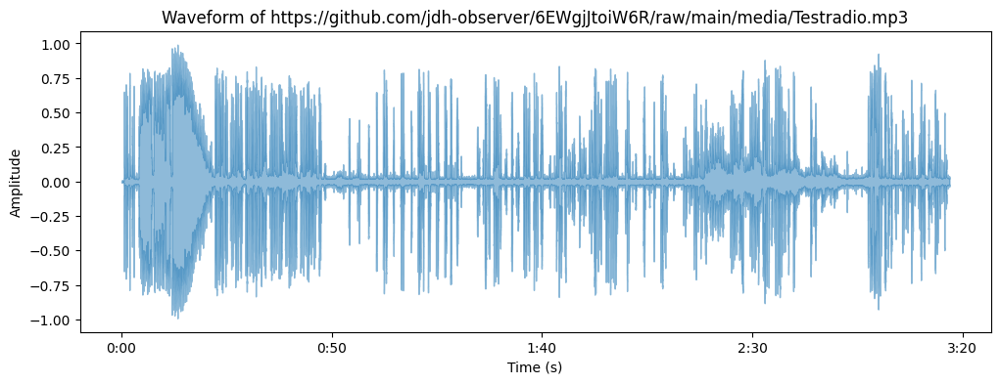

In [1]:
%matplotlib inline
import matplotlib
matplotlib.use('Agg')
import requests
import io
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image, display, Audio

def plot_waveform_and_play_audio(mp3_url):
    # Download the MP3
    response = requests.get(mp3_url, allow_redirects=True)
    response.raise_for_status()

    # Load the MP3 file using librosa
    y, sr = librosa.load(io.BytesIO(response.content), sr=None, mono=True)

    # Plot the waveform using librosa.display
    plt.figure(figsize=(12, 4))
    librosa.display.waveshow(y, sr=sr, alpha=0.5)
    plt.title('Waveform of {}'.format(mp3_url))
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.savefig('waveform.png', bbox_inches='tight')
    plt.close()
    display(Image(filename='waveform.png'))
    
    metadata={
        "jdh": {
            "module": "object",
            "object": {
                "type":"image",
                "source": [
                    "LABEL TO ADD"
                ]
            }
        }
    }

    # Play the audio
    display(Audio(data=y, rate=sr))

plot_waveform_and_play_audio('https://github.com/jdh-observer/6EWgjJtoiW6R/raw/main/media/Testradio.mp3')

This is an audio file represented in the so-called time-domain. It is commonly used for skeuomorphic purposes and might therefore be recognizable even beyond the audiophiles. Nevertheless, its smooth, suggestive surface hides a more complex truth. By zooming in on the visualization, we can come close to the bare bones of pulse code modulation, which is a means of measuring the soundwave at very small, regular intervals. The result corresponds to the fluctuation of air engendered by this specific sound. Although pulse code modulation is still a viable method for storing digital audio, the content remains rather unintelligible for human perception. It is possible to visually estimate a certain increase and decrease in dynamic throughout the file, but compared to the experience of listening, the visualization is informationally poor. To discern pitch and timbre from this data, we will have to employ Fourier transformations. In his essay on real time analysis, Friedrich Kittler described this method as a "mathematical magic trick from the 1820s that has since become indispensable for the computer age" as it facilitates a cross-over from whole to real numbers, combinatorics to calculus (<cite data-cite="14492245/U75D6Y8B"></cite>). It allows us to hear all the mathematical violins composing a sound's resounding character. The illustration below provides a simple demonstration of how Fourier's magic trick can transport us from the time domain to frequency domain.

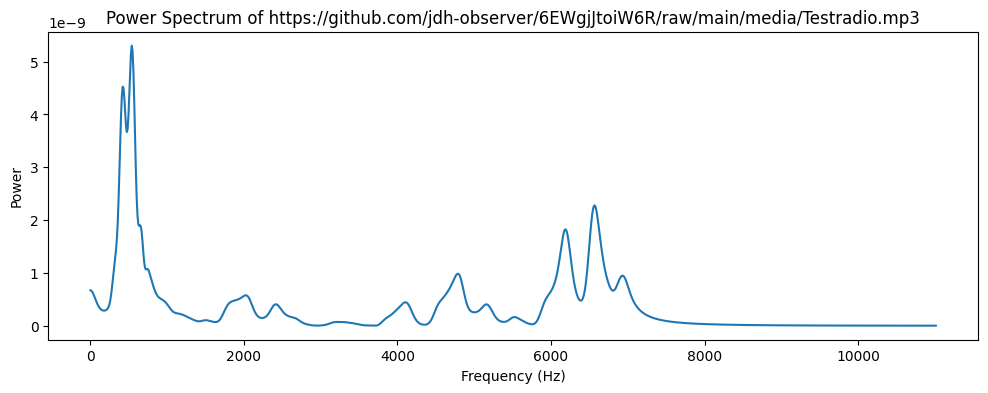

In [3]:
def plot_power_spectrum(mp3_url, frame_length=2048, hop_length=512):
    # Download the MP3 file from the URL
    response = requests.get(mp3_url, allow_redirects=True)
    response.raise_for_status()

    # Load the MP3 file using librosa
    y, sr = librosa.load(io.BytesIO(response.content), sr=None, mono=True)

    # Get the first frame of the audio file
    first_frame = y[:frame_length]

    # Compute the power spectrum
    power_spectrum = np.abs(np.fft.fft(first_frame))**2

    # Plot the power spectrum
    plt.figure(figsize=(12, 4))
    freqs = np.fft.fftfreq(frame_length, 1 / sr)
    plt.plot(freqs[:frame_length // 2], power_spectrum[:frame_length // 2])
    plt.title('Power Spectrum of {}'.format(mp3_url))
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power')
    plt.savefig('power_spectrum.png', bbox_inches='tight')
    plt.close()
    display(Image(filename='power_spectrum.png'))

plot_power_spectrum('https://github.com/jdh-observer/6EWgjJtoiW6R/raw/main/media/Testradio.mp3')


The spectrum displays the audio data the distribution of frequencies, or what we roughly can consider as pitches. Visually, this tells us significantly more about the character of the audio than the waveform above. Regrettably, this comes at cost of temporality – there is no time axis. Instead, this method displays a general distribution of frequencies for a specific amount of time. This plot displays the distribution in the first “frame” of the file - a significant concept in audio processing. In the following analysis, we shall employ the audio processing standard, which is a frame length of 2048, and a sampling rate of 44.1 kHz, which means that the actual sample window is about 46.4 milliseconds. The image above thus tells something about the tonality of the first half second of the audio file.  

To further determine the content of and audio file, we can proceed in several ways. One could simply describe it as a 3-minute excerpt of American radio from 1936. It is the dramatic first minutes of the classic detective story “The Thin Man”, starring Myrna Loy and William Powell. Though these names might still have cultural resonance in some places, the description actually reveals little about the sonic content. Alternatively, one could begin by processing and analyzing the signal information, which would require more advanced application of signal processing. Fortunately, audio signal processing has been developed in a variety of acoustically oriented fields. For more precise, small-scale analysis, phoneticians have long experience with digital signal processing, while musicologists have adopted a sophisticated use of digital methods, translating classical music analysis to computational realms. However, none of these approaches fully address the challenge of audio data spanning hundred, or thousand, of hours. Instead, this is an issue that has been tackled in the field of computational bioacoustics, where practitioners are well-versed in data of vast amounts. As a result, automated content segmentation and selection have become crucial under such circumstances, resulting in a variety of methods for detecting animal activity in large datasets. This comes methodologically closer to radio studies but differs in the sense that the aim usually concerns the targeting of rare and specific events in relatively information-sparse content (<cite data-cite="14492245/G2T6VVY6"></cite>).

There have been a few attempts in recent years to translate these methods into humanities practice. One of the forerunner has been The Institute on High Performance Sound Technologies for Access and Scholarship (HiPSTAS), founded in 2013. The project broke new grounds in humanities research through the application of computational audio analysis (<cite data-cite="14492245/E5NR4LBV"></cite>). Iben Have and Kenneth Evoldsen at Aarhus University, and Golo Föllmer at Halle University have all specifically explored the application of computational methods on radio (<cite data-cite="14492245/5AWGSMNC"></cite>, <cite data-cite="14492245/D4BQ5Q8V"></cite>). My working here aims to carry these initial attempts onwards. In particular, I aim to utilize the great affordances of this journal to invite the reader to also, partly, be a listener, and follow along in the experiments. My approach in the next section will remain rather rudimentary. The aim of this is both to provide a transparency of the method, and its simplicity, which I hope might in turn inspire further developments, or provoke improvements. Yet, I also remain on a rudimentary level in order to be able to discuss the very nature of historical sounds. 

My argument is that the historian working with mass media data, and radio recordings in particular, is dealing with a specific type of source material. This is not foremost an essentialist statement, but the necessary consequence of the insight there is no ‘one-size-fits-all’ in algorithmic analysis. The small-scale analysis of phonetics, albeit dealing with one of the fundamentals components of radio, speech, also differs significantly. Not only due to difference in size, but also because in historical audio, there is no guarantee for audio quality. There is perhaps then, more overlap with work being done in bioacoustics. Where bioacoustics and computational radio studies at least overlap is that the data is partly dense with information. In fact, when it comes to radio, it is even more rare to find silences from which segmentation can be derived. Instead, radio consists of continuities, countless hours, where the bracketing must be arbitrarily decided by the researcher. This is also a defining line towards the study of music. Computational musicology offers a rich set of tools, translatable to radio research, yet it deals with much clearly defined objects of study. Where a song usually has a beginning and an end, radio has neither. For this reason, this first part of the article will explore possible solutions to the problem of segmentation. 

To explore the function of audio segmentation, we can initially test the predeveloped method provided by librosa. The onset.detect function will look for significant changes in amplitude and make a time stamp whever they appear: 


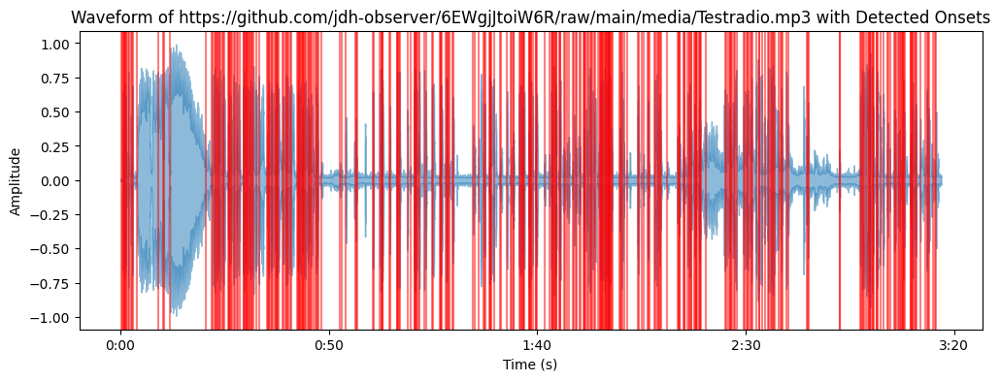

In [4]:
%matplotlib inline
def plot_waveform_with_onsets(mp3_url):
    # Download the MP3 file from the URL
    response = requests.get(mp3_url, allow_redirects=True)
    response.raise_for_status()
    
    # Load the MP3 file using librosa
    y, sr = librosa.load(io.BytesIO(response.content), sr=None, mono=True)

    # Detect onsets
    onsets = librosa.onset.onset_detect(y=y, sr=sr, units='time')
    
    # Plot the waveform using librosa.display
    plt.figure(figsize=(12, 4))
    librosa.display.waveshow(y, sr=sr, alpha=0.5)
    
    # Plot red lines for detected onsets
    for onset in onsets:
        plt.axvline(x=onset, color='r', alpha=0.5)
        
    plt.title('Waveform of {} with Detected Onsets'.format(mp3_url))
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.savefig('waveform_with_onsets.png', bbox_inches='tight')
    plt.close()
    display(Image(filename='waveform_with_onsets.png'))

plot_waveform_with_onsets('https://github.com/jdh-observer/6EWgjJtoiW6R/raw/main/media/Testradio.mp3')



The method clearily detectis events in the audio file, but the they appear with a very high regularity. This might be appropriate for certain types of analysis, but considering that we are dealing with more than thousend hours of radio, this density will not be very beneficial. Instead, a higher level of discrimination is needed. Librosa offers a solution to this problem. The reader can experiment with thi by going to the hermenutics layer above and adding the argument "delta" to the function "librosa.onset.onset_detect". Delta determines the treshold level for at what point value change shall be considered as significant. 

However, as delta approaches 0.3, discrimination begins to reach the limits of effectiveness. Only a few detection remain, but not in perfable point in time. Several decection are still made in the same speech sequence, whilst musical elements towards the are lost. This does not entail that the method is epistemologically false. Considered as an arousal of activity in the audible spectrum, delimited by the restabilizing of ‘silence’, each of these shopped up sentences are sonic events. However, this is not the only definition of a sonic event. In fact, my proposal here is that this is a rather inappropriate definition of a sonic event in the context of radio. Instead, I will attempt to propose a simple alternative.  

For the purpose of exploring these vast amounts of radio content, it is valuable to be able to distinguish more strictly between similar audio content and significantly new sounds. This is a consideration which has its cause in the characteristics of historical sound recordings. For example, for most of the history of sound recording there have been economic reasons to avoid unnecessary silences. Storage materials like vinyl, and tape are expensive in large amounts, and in the case of radio, silence entailed a risk of losing the audience (<cite data-cite="14492245/WNELG5PM"></cite>). Instead, it will be necessary to detect changes by other indications than pauses. When exploring the many hours of the archive, it is interesting to primarily segment sounds that are significantly new. What distinguishes one sound from another is a theoretical question with roots in the ancient Greeks, but we shall here contain ourselves with more recent arguments. 

The mid 20th century witnessed a resurging interest in the question of sound objects, spearheaded by thinkers and composers like Pierre Schaeffer. As early as 1966, another French theoretician, Abraham Moles, made significant strides towards a concept of the aural distinction. Moles himself was also interested in radio, considering it an “art of time” (<cite data-cite="14492245/YRANRKM3"></cite>). Working on the convergence between aesthetics and information theory, Moles sought to define the experience of sound in its signal-based core. We can use his definitions today in order to distinguish between different approaches to recorded sound. His proposition was that perception of sound had several different temporalities, corresponding to different stages of autocorrelation. The algorithm above concerns what Moles would call the “time of the present”. This level of perception echoes Husserl’s first degree of retention, an awareness of the temporally coexisting. Yet, sound is perceived on other temporal scales as well. Moles, who was highly interested in thresholds, posed that, if the amplitude analysis of audio events related to the limit between “absolute and its saturation”, human memory integrates a matter of “differential”. Thus, new sounds can be considered as events with different spectral form. But what constitutes a spectral form?

Moles makes the reasonable assumption that a spectral form must have some kind of continuity, some kind of autocorrelation. his can be translated into a detection method that looks for sustained similarity in the spectral activity over time. Focusing this endeavor on perceptible ranges of sonic activity, we shall limit the analysis to the mel-frequency cepstral coefficients (MFCC for short). This method is standardized in much audio processing today and, reductively explained functions to weight to parts of the audio spectrum which matter to human hearing. Since the range of audibility is centered roughly between 20 to 20,000 Hz, this can be simulated by taking the log of the input, granting results which more closely correspond to our expectations. The script below takes the audio file and outputs the MFCC in 13 spectral bands.

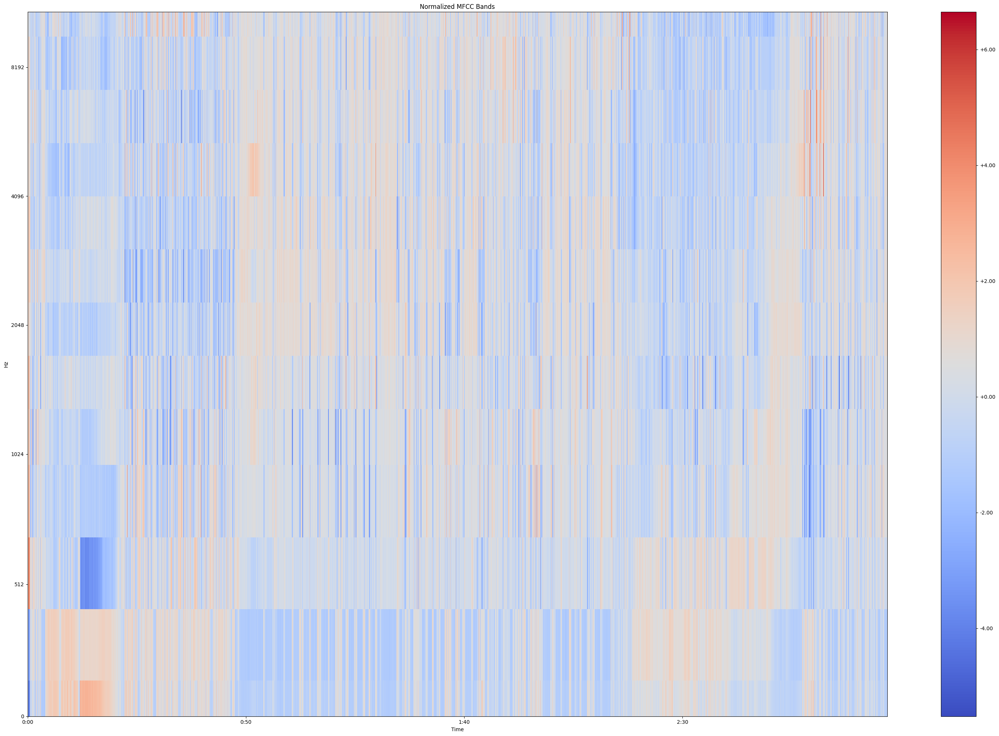

In [5]:
def visualize_mfcc(mp3_url):
    # Download the MP3 file from the URL
    response = requests.get(mp3_url, allow_redirects=True)
    response.raise_for_status()

    # Load the MP3 file using librosa
    y, sr = librosa.load(io.BytesIO(response.content), sr=None, mono=True)

    # Extract MFCC features
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)

    # Normalize MFCC values to have zero mean and unit variance
    mfcc_norm = (mfcc - np.mean(mfcc, axis=1, keepdims=True)) / np.std(mfcc, axis=1, keepdims=True)

    # Plot the normalized MFCC bands
    plt.figure(figsize=(30, 20))
    librosa.display.specshow(mfcc_norm, x_axis='time', y_axis='mel', sr=sr, cmap='coolwarm')

    plt.colorbar(format='%+0.2f')
    plt.title('Normalized MFCC Bands')
    plt.tight_layout()

    # Save the figure as an image file
    plt.savefig('normalized_mfcc_bands.png', bbox_inches='tight')
    plt.close()

    # Display the saved image
    display(Image(filename='normalized_mfcc_bands.png'))

visualize_mfcc('https://github.com/jdh-observer/6EWgjJtoiW6R/raw/main/media/Testradio.mp3')


To interpret this image, it is possible to imagine that we tilt it 90 degrees to the side. This would result in a sequence of small power spectrum, similar to one plotted above. This method provides a means to consider the spectral development over time and thus come closer to the desirable "timbral" character of a sound. I will not diverge into the long and heated history of debating timbre. For this approach it suffices to consider that there are today several popular methods for inquiring into the shape of sounds and how they change over time. In the following example, two such approaches are compared on the audio above. For each frame in the audio, the normalized MFCC and the spectral centroid have been calculated and plotted on the graph.

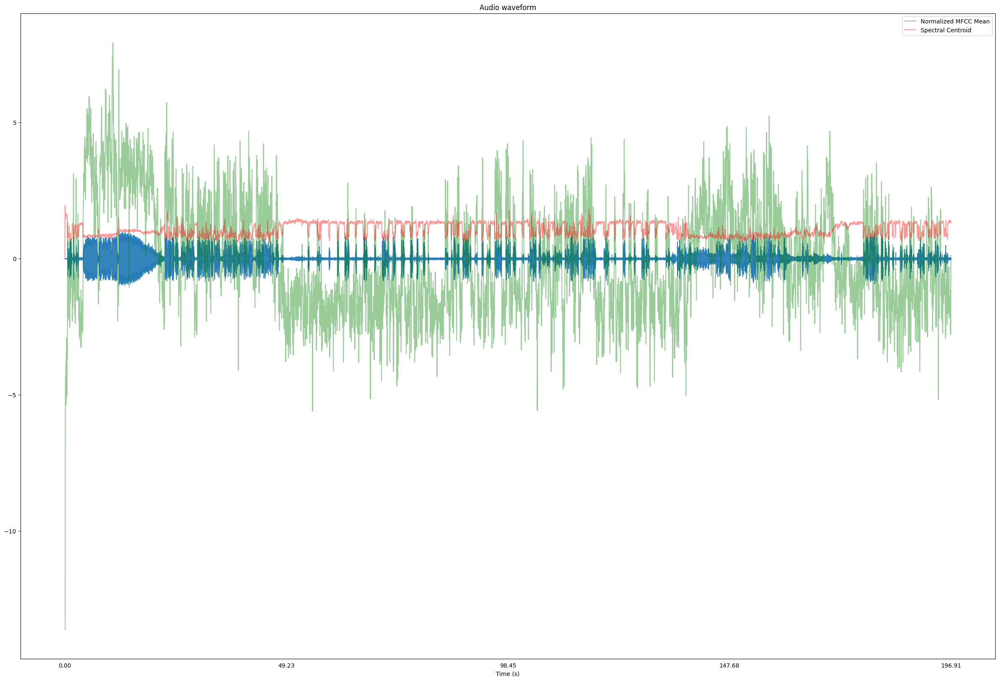

In [6]:
from IPython.display import Image
def analyze_audio(mp3_url):
    # Download the MP3 file from the URL
    response = requests.get(mp3_url, allow_redirects=True)
    response.raise_for_status()

    # Load the MP3 file using librosa
    y, sr = librosa.load(io.BytesIO(response.content), sr=None, mono=True)

    # Extract MFCC features and compute mean
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    mfcc_mean = np.mean(mfcc, axis=0)

    # Normalize MFCC values to have zero mean and unit variance
    mfcc_mean_norm = (mfcc_mean - np.mean(mfcc_mean)) / np.std(mfcc_mean)

    # Compute the spectral centroid for each frame
    spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=sr)

    # Plot the waveform, normalized MFCC mean, and spectral centroid
    fig, ax = plt.subplots(figsize=(30, 20))

    # Plot waveform
    librosa.display.waveshow(y, sr=sr, ax=ax, alpha=0.9)
    ax.set(title='Audio waveform')

    # Plot normalized MFCC mean on top of waveform
    time = np.arange(len(mfcc_mean)) * len(y) / len(mfcc_mean) / sr
    ax.plot(time, mfcc_mean_norm * (np.max(y) - np.min(y)) + np.mean(y), color='g', alpha=0.4, label='Normalized MFCC Mean')

    # Plot spectral centroid on top of waveform
    centroid_time = np.arange(spectral_centroid.shape[1]) * len(y) / spectral_centroid.shape[1] / sr
    ax.plot(centroid_time, spectral_centroid[0] / np.max(spectral_centroid) * (np.max(y) - np.min(y)) + np.mean(y), color='r', alpha=0.4, label='Spectral Centroid')

    # Add legend
    ax.legend()

    # Add time stamps at the bottom of the plot
    ax.set_xlabel('Time (s)')
    time_range = np.linspace(0, len(y)/sr, num=5)
    time_labels = [f'{t:.2f}' for t in time_range]
    plt.xticks(time_range, time_labels)
    plt.tick_params(axis='x', which='both', bottom=False, top=False)

    # Save the figure as an image file
    plt.savefig('audio_analysis.png', bbox_inches='tight')
    plt.close()

    # Display the saved image
    display(Image(filename='audio_analysis.png'))

analyze_audio('https://github.com/jdh-observer/6EWgjJtoiW6R/raw/main/media/Testradio.mp3')


Both methods provide a visual indication of similar segments. Instead of detecting several different occurrences within the musical segments, we receive on stable period of similarity. Nevertheless, the method is still suspectable to silences. In the interview segment towards the end of the file, longer pauses between answers still render gaps which would translate into new events. As the purpose here is to grasp the more significant segment changes within hundreds of hours, such granularity can be left out. In order to this, it is valuable to not only be able to measure the lasting similarity of acoustic events, but also their respective difference. Since the results of the normalized MFCC utilizes a greater range of values, difference will be easier to measure. Thus, in the following application, I shall leave central spectroid aside.

To put this into action, a simple code can be devised that takes the frame-by-frame MFCC value and compares it for similarity. When the mean value remains the same for a certain number of frames, the algorithm considers a sound to have been detected. However, this will generate new detections at a high frequency, so the algorithm can take advantage of the variation in the normalized MFCC results, comparing a newly detected similarity epoch with the values of the previous one. In order to focus on sonic forms beyond the short temporality of the “time of the present”, the algorithm is set to only include similarities longer than 10 frames, roughly corresponding to three seconds. The code in the hermeneutic layer also contains thresholds for similarity and difference. They control the amount of variation within the MFCC values which classifies a sound. There is no universally applicable setting available. Each audio data has its own particularities, and for the following analysis I’ve deduced an appropriate threshold bu testing. The method used below is not more complex than that, and the audio file can be dissected into different parts based on similarity.

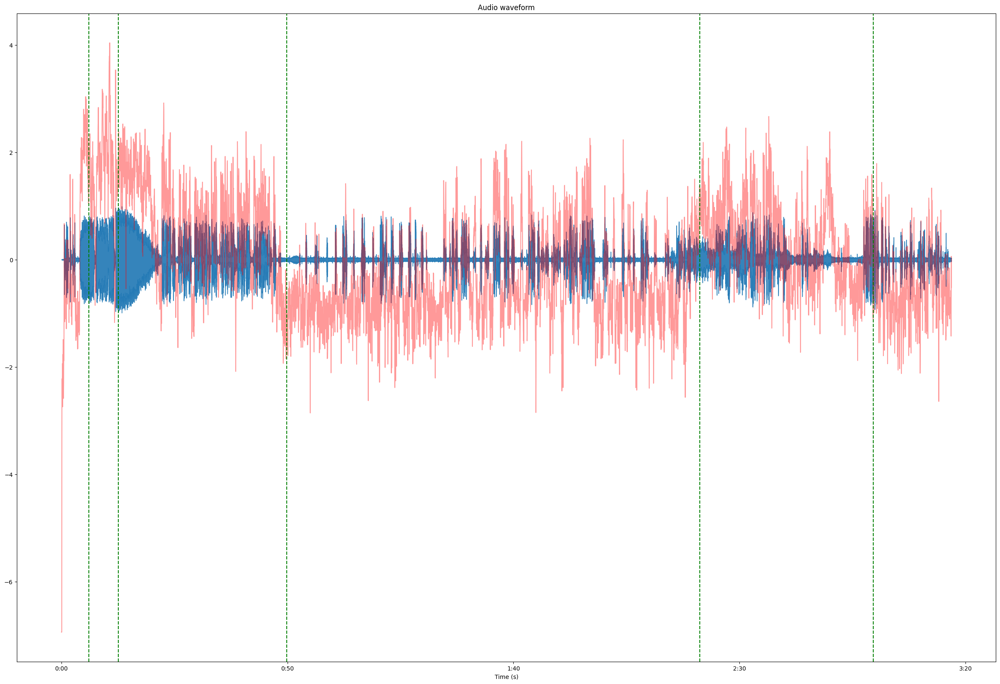

In [7]:
def analyze_audio(mp3_url, threshold, similarity_threshold):
    # Download the MP3 file from the URL
    response = requests.get(mp3_url, allow_redirects=True)
    response.raise_for_status()

    # Load the MP3 file using librosa
    y, sr = librosa.load(io.BytesIO(response.content), sr=None, mono=True)

    # Extract MFCC features and compute mean
    mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    mfcc_mean = np.mean(mfcc, axis=0)

    # Normalize MFCC values to have zero mean and unit variance
    mfcc_mean_norm = (mfcc_mean - np.mean(mfcc_mean)) / np.std(mfcc_mean)

    # Find frames where mean MFCC is within similar range for at least five consecutive frames
    similar_frames = []
    current_range = []
    prev_similar_mfcc = None
    for i, mfcc_val in enumerate(mfcc_mean_norm):
        if len(current_range) < 5:
            if len(current_range) == 0 or abs(mfcc_val - current_range[-1]) < threshold:
                current_range.append(mfcc_val)
            else:
                current_range = []
        elif abs(mfcc_val - current_range[-1]) < threshold:
            current_range.append(mfcc_val)
        else:
            if prev_similar_mfcc is None or abs(prev_similar_mfcc - current_range[0]) > similarity_threshold:
                similar_frames.append((i-5, i))
                prev_similar_mfcc = current_range[0]
            current_range = []

    # Plot audio waveform and mean MFCC
    fig, ax = plt.subplots(figsize=(30, 20))

    # Plot waveform
    librosa.display.waveshow(y, sr=sr, ax=ax, alpha=0.9)
    ax.set(title='Audio waveform')

    # Plot mean MFCC on top of waveform
    time = np.arange(len(mfcc_mean)) * len(y) / len(mfcc_mean) / sr
    ax.plot(time, mfcc_mean_norm, color='r', alpha=0.4)

    # Add vertical lines for similar frames
    for start, _ in similar_frames:
        start_time = librosa.frames_to_time(start, sr=sr) - 3
        ax.axvline(x=start_time, color='g', linestyle='--')


    ax.set_xlabel('Time (s)')
    # Save the figure as an image file
    plt.savefig('analysis_plot.png', bbox_inches='tight')
    plt.close()

    # Display the saved image
    display(Image(filename='analysis_plot.png'))

analyze_audio('https://github.com/jdh-observer/6EWgjJtoiW6R/raw/main/media/Testradio.mp3', 0.15, 1.5)

On this rather granular scale, it becomes apparent that the method bundles together content rather crudely. But as we scale the method up in the next section, it will provide a useful discrimination when considering the hundreds of hours of radio content. When exploring the more general character of such a large set of data, focusing on significant changes will be beneficial for analyses, such as object classification. While there are effective pre-trained models for identifying specific sounds in a recording, applying granular object classification to radio content would be a waste of its capacity. The absolute majority of content will be either speech or music, resulting in a copious number of labels of the same type. By segmenting the audio in the manner mentioned above, it is possible to focus computational resources on the less known aspects of the data.

This description summarizes the method of preprocessing the audio in the following study. I hope to have demonstrated the value of lingering upon this initial step of the analysis. Preprocessing might sound arbitrary, but these decisions set the frame for the very analysis ahead. And in regard to historical radio data, there really are no predefined standards. As noted, many of the choices border on the arbitrary, serving only the function of providing an effective threshold for this particular material. I therefore also encourage the reader to access the hermeneutics layer and explore the settings, and the different results they generate. The approach suggest here is intended to be easily replicable, with the aim of further improvement and updating(<cite data-cite="14492245/IGEQZCQQ"></cite>).

# The sample set and its historical significance

As the attentive listener might have noticed, the sample sound inspected above is in fact not Swedish radio, despite this being the topic of the historical analysis. As mentioned above, the reason for this is a strict legal interpretation which prohibits the spread of these files. The old American samples have served as a mean to grant better understanding of the method and algorithms in use. Beyond this point, however, the analysis will deal with data which is protected. Therefore, the files only contain relevant acoustic data extracted from the actual files. The legally restricted status of the data has also affected my access, limiting the sample size used in the study. The methods applied would be valid for much larger data collections. Nevertheless, the results can still provide interesting indications.

The aim of this inquiry is to better understand the stylistic development of radio, particularly public service radio, and its position as an antithesis to commercial radio. The distinction between the two has maintained an important status in media studies. In theory, the distinction is quite clear. Commercial radio is considered economically dependent on audience numbers, whereas public service supposedly has autonomy against these matters for the benefit of other values. However, as Denis McQuail has shown, this is not always such a clear case in practice (<cite data-cite="14492245/EKUSKWUU"></cite>). The structure of public service broadcasting can range from attempts to “become more cost-conscious”, to parts, like distribution networks and whole channels, being sold off (<cite data-cite="14492245/MRR9NQVP"></cite>). There are research examples demonstrating real-world cases in all parts of this scale. This tradition of deconstructing the notion of public service broadcasting is strongly centered on organizational and economic factors. Since the definition of public service broadcasting resides on this economic level, it appears intuitive to imagine it as a spectrum that would also contain real-world examples of all sorts. But what about the actual radiophonic content? Can we talk about a certain non-commercial style of broadcasting?

I would argue that this is a question that has received too little attention. It is an obvious point to make that if a music-oriented channel on a public service broadcasting network aims to play contemporary music, it will share much of its content with commercial stations. Considering that, for such a radio station, the absolute majority of the content will be music, this clearly troubles the idea of non-commercial radio content. The line of thought can be extended to more general features. There is, for example, a long tradition in radio semiotics, from the early media theory of Rudolf Arnheim to the radio studies of Andrew Crisell and onwards, suggesting that radio's chief components are made up of speech, music, noise, and silence. As I have discussed elsewhere, the sheer amount of these categories is far from sufficient for determining any significant difference between commercial radio and public service broadcasting. There are going to be large amounts of talk and music, regardless of the economic structure of the broadcasters. If we are to search for stylistic differences, they must be deduced from more subtle spectral elements. These factors will be discussed further in the analysis. However, this discussion might still beg the question of why we should be looking for a rarefied public service broadcasting style of radio broadcasting.

To better understand the significance of this endeavor, the case of Swedish radio is principial. Until the early 1990s, the concept of radio style was limited to matters of separate channels within the monopoly. For example, P1 was a speech-oriented, informational channel, while P3 was a popular music channel, and P2 was oriented around classical music and jazz. The tempo, distribution of music and speech, tonality, and overall aesthetics of the channels were, at least during the first part of the second half of the century, clearly distinguished. The stylistic matter was chiefly a question of internal balance between these channels. However, during the 1990s, this position was subject to change. In 1993, SR instigated an internal “product development group”, tasked to determine the PBS “identity”. The cause was the “new competitive landscape”, a euphemism for the commercialization of the airwaves that took place the same year. From September 1993, broadcasting would be effectively available for any commercial broadcaster with a license.

The effect of such structural reorganization remains a matter for debate. On the one hand, it should not interfere with the economically autonomous institution of PSB. On the other hand, part of the very contract which regulates SR financing, stresses the importance of the public. Losing too many audience members to commercial alternatives would put PSB in an endangered position. Thus, the matter of audience appeal seems necessarily reframed in a commercially competitive light. This change in the landscape of broadcasting makes it necessary to consider the style of PBS. It is not only the existential right of SR that is at stake in this matter; media studies itself has a lot hinging on this distinction. The problematization and scrutinizing of commercial radio is a red thread through critical radio studies. Authors like Wolfgang Hagen and David Hendy have made convincing cases. My work here is note dispute their warnings of the self-similar and uncreative output of American commercial broadcasting. It is just interesting to note that these arguments generally assume that there is something like “noncommercial radio.” Since the discussions are not only about economic and organizational structures but “about the programming of self-identity,” it becomes essential to inspect a case like Sweden in order to look for any distinct features of non-commercial broadcasting.

For this purpose, the analysis below considers a sample set of 10 randomized sample days from two years before the introduction of commercial radio; 1988 and 1991, and two years after; 1994 and 1998. The two most popular PSB channels have been used, P1 and P3. The goal with this selection is to achieve a grasp of the changes occurring in conjecture with introduction of commercial radio. Each day consists of roughly 18 hours of data, resulting in about 1600 hours of radio. The actual data is split into several files for each day and required manual work to piece together and normalize. Nonetheless, with its uniquely early legal deposit regulation, the Swedish media archive offers a unique insight into the changes during this epoch. The possibility to study entire broadcasting days, instead of selection by the radio company themselves, grants a rich understanding of the global structure of broadcasting, and how it changes over time. The data can be investigated below: 

In [8]:
import pandas as pd

df = pd.read_csv("https://github.com/jdh-observer/6EWgjJtoiW6R/raw/main/script/audio_featuresmean.csv")
df

,file_name,subfolder_name,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,...,mfcc_30,mfcc_31,mfcc_32,mfcc_33,mfcc_34,mfcc_35,mfcc_36,mfcc_37,mfcc_38,mfcc_39
0,P194413.mp3,P1 94,-130.640750,95.719910,36.910250,18.147339,8.248773,8.716107,1.948535,9.001754,...,-2.226646,3.504132,-1.696551,2.553017,-2.490185,2.105653,-3.185234,1.075711,-3.496393,1.939853
1,P1941100.mp3,P1 94,-65.923164,162.809370,-76.887110,59.366543,-41.950783,29.833572,-23.222778,5.104844,...,-5.184048,-0.529487,-5.948292,-0.708712,-3.467590,-3.826805,-2.028755,-4.252794,-0.260111,-3.803553
2,P194375.mp3,P1 94,-267.171570,49.360020,24.592335,9.777505,1.540333,16.161896,2.483608,9.958631,...,-3.001189,1.501884,-4.214302,1.306175,-3.984725,0.613321,-3.866326,0.543965,-4.622788,-0.500229
3,P194361.mp3,P1 94,-210.070720,91.890020,39.885690,-5.403785,2.383429,6.799300,-13.030035,-7.856565,...,-6.512291,3.110769,-5.225624,-9.688672,-16.019100,-1.513217,4.518225,4.848954,-7.994964,-4.889642
4,P1941114.mp3,P1 94,-120.705010,151.363770,-32.147910,46.953785,-28.842468,12.098566,-15.483828,2.240734,...,6.185246,7.859300,-1.671809,-2.331173,1.602509,7.748474,9.977833,11.565618,-2.038823,-7.245639
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10221,P394303.mp3,P3 94,-177.204200,91.015144,29.937757,19.737476,0.557302,10.136041,-0.329763,6.975668,...,-2.162491,2.738328,-2.150340,2.345365,-1.832593,2.119389,-3.352271,1.240621,-2.557410,2.223747
10222,P394465.mp3,P3 94,-2.503673,70.974890,14.385892,9.005135,8.122117,12.003442,5.235718,5.271800,...,-2.963235,2.319351,-2.357939,2.731935,-3.104996,1.668923,-3.267989,1.751731,-2.699040,1.641824
10223,P3941012.mp3,P3 94,-144.266070,108.704666,-47.015620,59.088158,-20.322231,40.373283,-4.900066,23.997707,...,-1.393880,-3.400689,-3.597212,3.361480,-3.537740,3.063557,1.097137,-0.959446,-4.133151,3.950492
10224,P3949.mp3,P3 94,-78.534195,106.199715,-21.493090,54.876724,-6.358211,19.516365,-10.275764,9.387917,...,-1.973788,2.612626,-0.059760,0.385828,-4.475466,1.951184,-4.228179,-1.187172,0.117752,2.422045


# Analysis 

Through the method outlined in the previous sections, the extensive audio data from each yearly set can be condensed into a collection of sample blocks. As demonstrated earlier, the audio has been analyzed for breaks in similarity sequences, from which 3-second-long samples have been extracted. 3 second samples are chosen as this correspond to the shortest allowed sonic event.  To preserve the integrity of the audio content, arbitrary data such as MFCC data has been extracted separately. The result presents the most significant sonic sequences within the data. Notably, there is a slight shift in the number of detected occurrences for each year. Where the algorithm detected 1433 objects in the sample data from P3 in 1988, only 1030 was found a decade later. The decision has been made to keep these statistical variations, as they reflect the overall structure of the broadcasting. However, this slight imbalance should be kept in mind as we explore the distribution between the years. To better understand the nature of these sonic features, we can begin by mapping their internal relationship using complexity reduction techniques and plotting them in Euclidean space.

PCA is a well-known tool in the digital historian's toolbox, and its mechanics can be studied here (ref). In the plot, MFCC data has been extracted from each 3-second sample and subsequently aligned on the axis of the PCA plot. The following code allows for switching between PCA and different scales of UMAP in order to explore the dataset. The comparison between the two allows to compensate the respective limitations. PCA is a linear technique that transforms data into a new coordinate system where the first axes capture most of the variation in the data. While PCA is good at preserving the global structure of data, it can miss non-linear patterns or relationships among the data. PCA is also sensitive to scaling of features and can be affected by noise or outliers. UMAP, on the other hand, is a non-linear technique that builds on a graph of nearby data points and tries to preserve the local structure of the manifold. UMAP is better at separating different groups of data and capturing non-linear variations in data. UMAP is also more flexible and scalable than PCA and can handle different types of data. However, UMAP is more complex, random, and sensitive to hyperparameters such as the number of neighbors or minimum distance.

Result shape: (10226, 6)


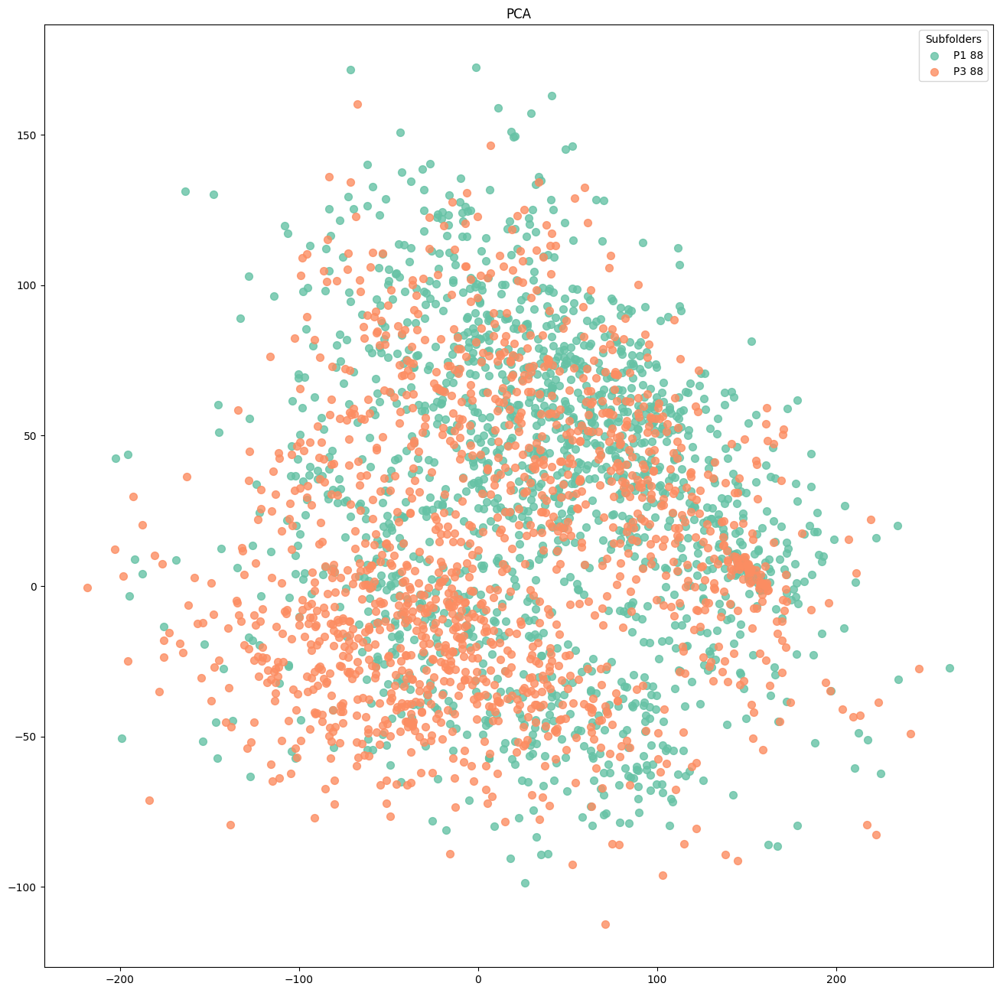

Result shape: (10226, 6)


OMP: Info #270: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


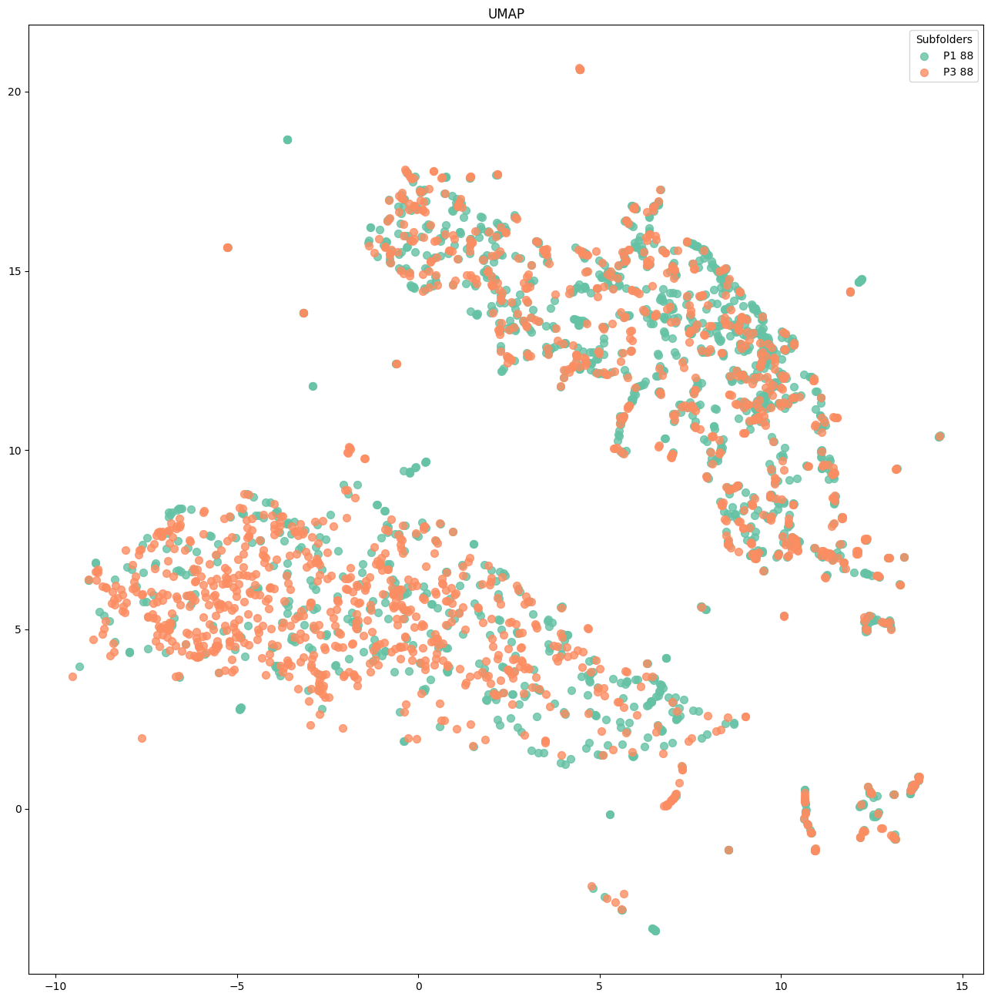

In [9]:
import os
import csv
import json
import matplotlib.cm as cm
from sklearn.decomposition import PCA
import warnings
import re
import umap

csv_file_url = 'https://github.com/jdh-observer/6EWgjJtoiW6R/raw/main/script/audio_featuresmean.csv'

# Custom sorting function
def custom_sort_key(name):
    match = re.match(r"([a-zA-Z]+)(\d+)\s(\d+)", name, re.I)
    if match:
        items = match.groups()
        return items[0], int(items[1]), int(items[2])
    else:
        return name

def plot_result(result, audio_file_info, subfolder_names, title='PCA'):
    plt.figure(figsize=(16, 16))
    plt.title(title)
    color_map = {subfolder_name: color for color, subfolder_name in zip(cm.Set2.colors, subfolder_names)}

    # Sort audio_file_info by subfolder names
    audio_file_info = sorted(audio_file_info, key=lambda x: custom_sort_key(x[1]))

    for idx, (file_name, subfolder_name) in enumerate(audio_file_info):
        plt.scatter(result[idx, 0], result[idx, 1], color=color_map[subfolder_name], label=subfolder_name, s=50, alpha=0.8)

    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))

    # Sort the legend using the custom_sort_key function
    sorted_legend = sorted(by_label.items(), key=lambda x: custom_sort_key(x[0]))
    plt.legend([item[1] for item in sorted_legend], [item[0] for item in sorted_legend], title='Subfolders', loc='upper right')

    plt.show()

def plot_from_csv(csv_file_url, title='PCA', selected_subfolders=None):
    data = pd.read_csv(csv_file_url)
    audio_file_info = [(row['file_name'], row['subfolder_name']) for _, row in data.iterrows()]

    # Filter audio_file_info based on selected_subfolders
    if selected_subfolders is not None:
        audio_file_info = [(file_name, subfolder_name) for file_name, subfolder_name in audio_file_info if subfolder_name in selected_subfolders]

    subfolder_names = sorted(set([subfolder_name for _, subfolder_name in audio_file_info]), key=custom_sort_key)

    # Load MFCC values directly from the columns
    mfcc_columns = [f'mfcc_{i}' for i in range(6)]
    result = np.array(data[mfcc_columns].values)
    print("Result shape:", result.shape)

    # Perform PCA on the loaded data
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(result)

    plot_result(pca_result, audio_file_info, subfolder_names, title=title)
    
    return pca_result, audio_file_info, subfolder_names

def plot_from_csv_umap(csv_file_url, title='UMAP', selected_subfolders=None):
    data = pd.read_csv(csv_file_url)
    audio_file_info = [(row['file_name'], row['subfolder_name']) for _, row in data.iterrows()]

    # Filter audio_file_info based on selected_subfolders
    if selected_subfolders is not None:
                audio_file_info = [(file_name, subfolder_name) for file_name, subfolder_name in audio_file_info if subfolder_name in selected_subfolders]

    subfolder_names = sorted(set([subfolder_name for _, subfolder_name in audio_file_info]), key=custom_sort_key)

    # Load MFCC values directly from the columns
    mfcc_columns = [f'mfcc_{i}' for i in range(6)]
    result = np.array(data[mfcc_columns].values)
    print("Result shape:", result.shape)

    # Perform UMAP on the loaded data
    reducer = umap.UMAP(n_neighbors=10, min_dist=0.1, n_components=2, metric='euclidean')
    umap_result = reducer.fit_transform(result)

    plot_result(umap_result, audio_file_info, subfolder_names, title=title)

    return umap_result, audio_file_info, subfolder_names

selected_subfolders = ['P1 88', 'P3 88']
pca_result, audio_file_info, subfolder_names = plot_from_csv(csv_file_url, title='PCA', selected_subfolders=selected_subfolders)
umap_result, audio_file_info, subfolder_names = plot_from_csv_umap(csv_file_url, title='UMAP', selected_subfolders=selected_subfolders)


Both plots display the data from P1 and P3 from the year 1988, layered on top of each other. The PCA plot from P1 demonstrates a slightly broader shape, indicating a wider variation in the MFCC data extracted from its samples. P3 is more clustered, suggesting a higher similarity among its samples. However, focusing on the UMAP results, both channels have a mass of content centered around the same area, but P3 exhibits certain unique and separate clusters, suggesting a wholly different type of sound. This can be interpreted in the light of UMAP being considered as providing better grasp of local clusters. If we interpret these results from the perspective of sonic identity, it would be tempting to say that P1 has a less clear profile. 

To better understand the degree to which these results actually capture any significant qualities in the sound, such an unsupervised method can be complimented with a pretrained module for object recognition. Today the methods for sound classification have grown mature and advanced, offering relatively reliable classification possibilities for content categorization. Due to availability of massive training data sets, the likes of “audioset”, the development is rapid (<cite data-cite="14492245/TPC5DAIR"></cite>). However, this type of classification can be quite processing-heavy and would be straining to apply to the 1600 hours of data. Thus, this exposes one of the benefits of the pre-processing in which we have already extracted a representative selection of the variation of different sounds.

In the following figure, the EfficiantAT model has been used to embed categories to the samples. EfficiantAT is one of the best performing audio classification solutions around and offers a set of pretrained models with varying complexity. The model “mn20_as_ext” has been employed, which is one of the more granular and accurate models. To get a sense of the reliability of the results, the following graph displays the security percentage on the data from the separate highest achieving models. As the audio files are not public, this process cannot be included in the hermeneutical layer. Therefore, the following graphs are saved from my private notebooks.

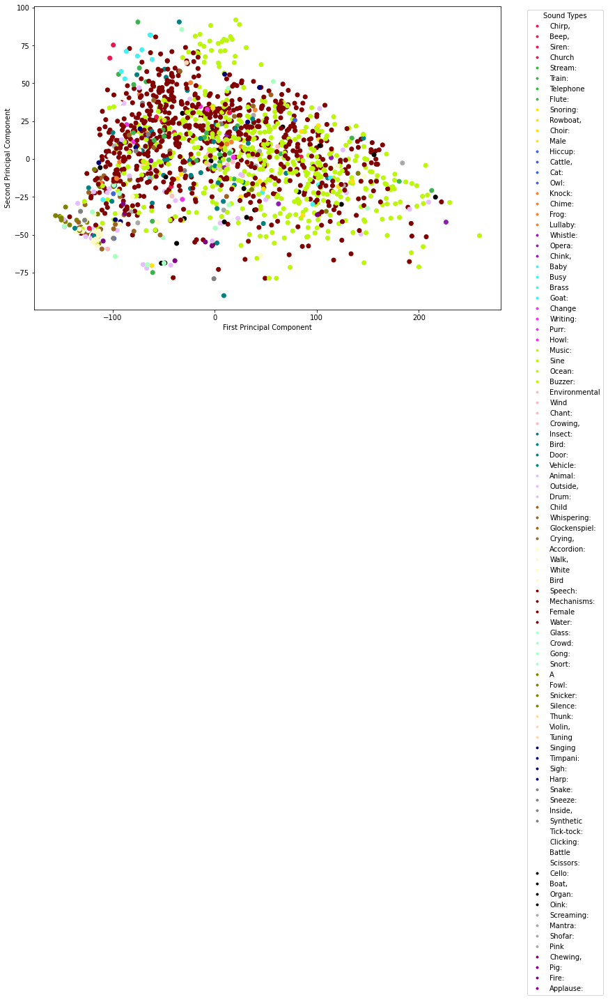

In [10]:
from IPython.display import Image, display

display(Image("./media/1.png"))

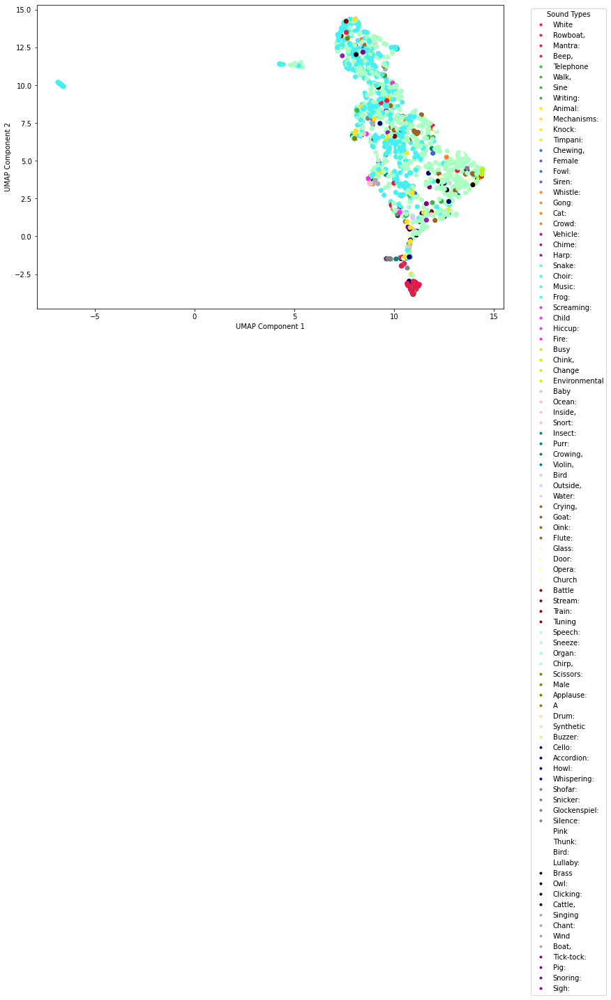

In [11]:
from IPython.display import Image, display

display(Image("./media/2.png"))

There are some eyebrow-raising identifications. The fact that the algorithm detects both an “Oink” and a “pig” may strike the reader as a rural hallucination. To my own surprise, I discovered that there were in fact instances of pig sounds in one of the sample days, linked to a reportage on farming. The same result came from exploring the enigmatic presence of a “goat” in the audio. The “snake” was harder to identify, the sound was more likely caused by a microphone noise. Regardless, the accuracy was surprising. 

Certain distinctions are also questionable in their detail. While many results could have been condensed under the label music, the algorithm instead detects variations on the theme, including choir, whistle, opera, and so on. The results are nevertheless an important reminder of the tendencies of radio content to be centered around speech and music. As pointed out already by the early radio theory of Rudolf Arnheim, radio is limited to a narrow set of semiotic expressions, whereof speech and music are the most central, farm animals not included. 

More importantly, however, this method stresses interesting discrepancies between the two techniques. Although the UMAP example seems to concentrate certain categories in the same clusters, it is evident that the dimension reduction technique and the pretrained audio classification catch widely different aspects of the recordings. Many distinct sounds and symbols are effectively meshed into the same cluster without much distinction. This should perhaps come as no surprise since we are dealing with complexity reduction. However, it is not that PCA is blind to differences – basing the distribution on MFCC values just allows for distinctions that are unfamiliar to more established cultural categorizes. Where a “chant” and a “mantra” may appear very distinct to the listener engaged in these activities, the sonic qualities are much less distinct than between two different mantras. Thus, the approach is limited in its grasp of cultural signification. However, in another sense, such a shift in perspective allows for new ways of thinking about the sounds of radio. The method enables inquiry into the global sonic characteristics of the radio. From this perspective, it becomes all the more interesting to explore the data over time. In the following figures, P1 data is plotted over four sample years from the decade, respectively. To aid the visual estimation, the average pairwise distance value for each sample set is printed below.

Result shape: (10226, 6)


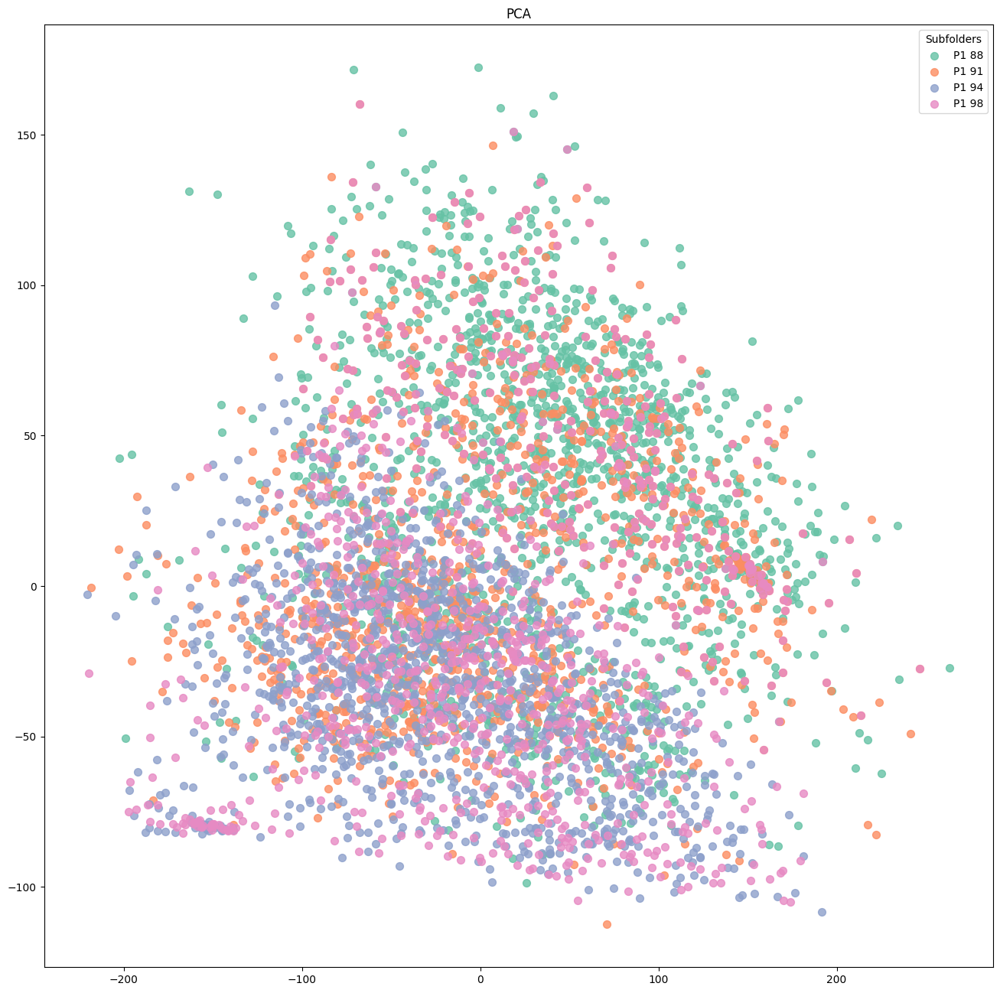

Average intra-cluster distances (PCA):
P1 88: 116.15
P1 91: 121.98
P1 94: 114.77
P1 98: 94.72


In [12]:
%matplotlib inline
from sklearn.metrics import pairwise_distances
import re

# Custom sorting function
def custom_sort_key(name):
    match = re.match(r"([a-zA-Z]+)(\d+)\s(\d+)", name, re.I)
    if match:
        items = match.groups()
        return items[0], int(items[1]), int(items[2])
    else:
        return name
def plot_result(result, audio_file_info, subfolder_names, title='PCA'):
    plt.figure(figsize=(16, 16))
    plt.title(title)
    color_map = {subfolder_name: color for color, subfolder_name in zip(cm.Set2.colors, subfolder_names)}

    # Sort audio_file_info by subfolder names
    audio_file_info = sorted(audio_file_info, key=lambda x: custom_sort_key(x[1]))

    for idx, (file_name, subfolder_name) in enumerate(audio_file_info):
        plt.scatter(result[idx, 0], result[idx, 1], color=color_map[subfolder_name], label=subfolder_name, s=50, alpha=0.8)

    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))

    # Sort the legend using the custom_sort_key function
    sorted_legend = sorted(by_label.items(), key=lambda x: custom_sort_key(x[0]))
    plt.legend([item[1] for item in sorted_legend], [item[0] for item in sorted_legend], title='Subfolders', loc='upper right')

    plt.show()

def plot_from_csv(csv_file_url, title='PCA', selected_subfolders=None):
    data = pd.read_csv(csv_file_url)
    audio_file_info = [(row['file_name'], row['subfolder_name']) for _, row in data.iterrows()]

    # Filter audio_file_info based on selected_subfolders
    if selected_subfolders is not None:
        audio_file_info = [(file_name, subfolder_name) for file_name, subfolder_name in audio_file_info if subfolder_name in selected_subfolders]

    subfolder_names = sorted(set([subfolder_name for _, subfolder_name in audio_file_info]), key=custom_sort_key)

    # Load MFCC values directly from the columns
    mfcc_columns = [f'mfcc_{i}' for i in range(6)]
    result = np.array(data[mfcc_columns].values)
    print("Result shape:", result.shape)

    # Perform PCA on the loaded data
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(result)

    plot_result(pca_result, audio_file_info, subfolder_names, title=title)
    
    return pca_result, audio_file_info, subfolder_names

def print_intra_cluster_distances(result, audio_file_info, subfolder_names, method='PCA'):
    distances = pairwise_distances(result)
    subfolder_avg_distances = {}

    for subfolder_name in subfolder_names:
        subfolder_distances = []

        for i, (_, subfolder_name_i) in enumerate(audio_file_info):
            if subfolder_name_i == subfolder_name:
                for j, (_, subfolder_name_j) in enumerate(audio_file_info):
                    if subfolder_name_j == subfolder_name and i != j:
                        subfolder_distances.append(distances[i][j])

        subfolder_avg_distances[subfolder_name] = np.mean(subfolder_distances)

    print(f"Average intra-cluster distances ({method}):")
    for subfolder_name, avg_distance in subfolder_avg_distances.items():
        print(f"{subfolder_name}: {avg_distance:.2f}")

selected_subfolders = ['P1 88', 'P1 91', 'P1 94', 'P1 98']
pca_result, audio_file_info, subfolder_names = plot_from_csv(csv_file_url, title='PCA', selected_subfolders=selected_subfolders)
print_intra_cluster_distances(pca_result, audio_file_info, subfolder_names, 'PCA')


The P1 results appear at first sight to be almost opposite to expectations. We see a concentration of spectral variation up until 1991, before the introduction of commercial radio. More surprisingly, the data from the year directly after indicates a significant increase in diversity. This is noteworthy, as it could be interpreted to be in direct opposition to the aim of establishing a more distinct identity. The internal documents from 1993 links the concept of identity to aesthetic self-similarity. Even the microphones ought to have the same logo on them. It is therefore curious that the sample data moves in such a plain opposite direction. Before trying to understand this, let’s consider the P3 results.

Result shape: (10226, 6)


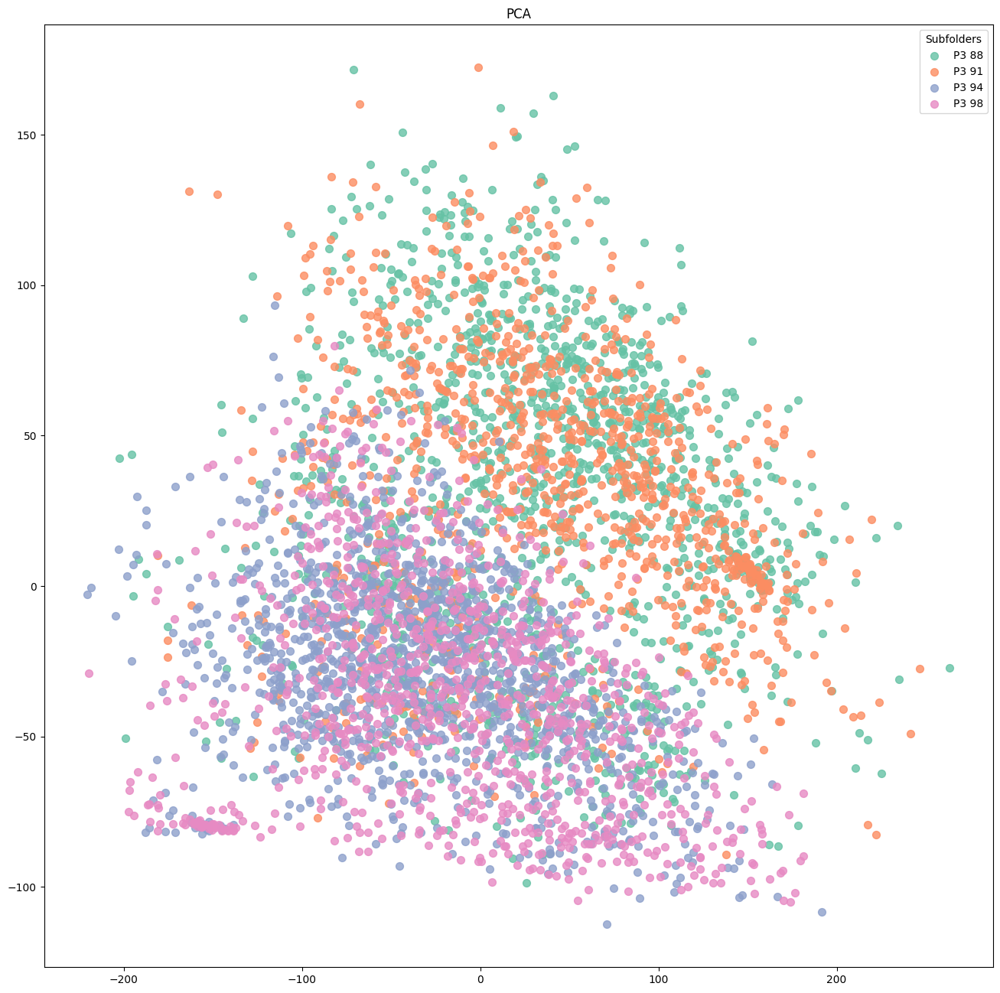

Average intra-cluster distances (PCA):
P3 88: 99.95
P3 91: 102.04
P3 94: 106.19
P3 98: 115.43


In [13]:
%matplotlib inline
import re

# Custom sorting function
def custom_sort_key(name):
    match = re.match(r"([a-zA-Z]+)(\d+)\s(\d+)", name, re.I)
    if match:
        items = match.groups()
        return items[0], int(items[1]), int(items[2])
    else:
        return name
def plot_result(result, audio_file_info, subfolder_names, title='PCA'):
    plt.figure(figsize=(16, 16))
    plt.title(title)
    color_map = {subfolder_name: color for color, subfolder_name in zip(cm.Set2.colors, subfolder_names)}

    # Sort audio_file_info by subfolder names
    audio_file_info = sorted(audio_file_info, key=lambda x: custom_sort_key(x[1]))

    for idx, (file_name, subfolder_name) in enumerate(audio_file_info):
        plt.scatter(result[idx, 0], result[idx, 1], color=color_map[subfolder_name], label=subfolder_name, s=50, alpha=0.8)

    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))

    # Sort the legend using the custom_sort_key function
    sorted_legend = sorted(by_label.items(), key=lambda x: custom_sort_key(x[0]))
    plt.legend([item[1] for item in sorted_legend], [item[0] for item in sorted_legend], title='Subfolders', loc='upper right')

    plt.show()

def plot_from_csv(csv_file_url, title='PCA', selected_subfolders=None):
    data = pd.read_csv(csv_file_url)
    audio_file_info = [(row['file_name'], row['subfolder_name']) for _, row in data.iterrows()]

    # Filter audio_file_info based on selected_subfolders
    if selected_subfolders is not None:
        audio_file_info = [(file_name, subfolder_name) for file_name, subfolder_name in audio_file_info if subfolder_name in selected_subfolders]

    subfolder_names = sorted(set([subfolder_name for _, subfolder_name in audio_file_info]), key=custom_sort_key)

    # Load MFCC values directly from the columns
    mfcc_columns = [f'mfcc_{i}' for i in range(6)]
    result = np.array(data[mfcc_columns].values)
    print("Result shape:", result.shape)

    # Perform PCA on the loaded data
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(result)

    plot_result(pca_result, audio_file_info, subfolder_names, title=title)
    
    return pca_result, audio_file_info, subfolder_names

def print_intra_cluster_distances(result, audio_file_info, subfolder_names, method='PCA'):
    distances = pairwise_distances(result)
    subfolder_avg_distances = {}

    for subfolder_name in subfolder_names:
        subfolder_distances = []

        for i, (_, subfolder_name_i) in enumerate(audio_file_info):
            if subfolder_name_i == subfolder_name:
                for j, (_, subfolder_name_j) in enumerate(audio_file_info):
                    if subfolder_name_j == subfolder_name and i != j:
                        subfolder_distances.append(distances[i][j])

        subfolder_avg_distances[subfolder_name] = np.mean(subfolder_distances)

    print(f"Average intra-cluster distances ({method}):")
    for subfolder_name, avg_distance in subfolder_avg_distances.items():
        print(f"{subfolder_name}: {avg_distance:.2f}")

selected_subfolders = ['P3 88', 'P3 91', 'P3 94', 'P3 98']
pca_result, audio_file_info, subfolder_names = plot_from_csv(csv_file_url, title='PCA', selected_subfolders=selected_subfolders)
print_intra_cluster_distances(pca_result, audio_file_info, subfolder_names, 'PCA')


In contrast, P3 is displaying a wider distribution of sound, starting from its earliest dates. The possible cause for this could be related to the reliance of popular music on P3. Previous research has shown that popular music had witnessed a decrease in timbral variation during the 80s (<cite data-cite="14492245/LEHMND6G"></cite>). This implies that the songs and artists in popular rotation during the 80s were employing a smaller and more predictable part of the frequency spectrum. However, by the end of the decade, data has displayed how frequency variation significantly increases again.  Given that P3 kept a rotation mostly consisting of the popular contemporary music, it would be reasonable to assume that it would reflect this increase in spectral variation over the years. Therefore, the increase in variation in the late 80s could be part of the general increase in pop musical timbre during that period. Perhaps more interesting is the development between 1991 and 1994, which strongly resembles P1. P3 also displays its most significant change between these two samples years, and in the direction of increased spectral diversification. The mean pairwise distance increases from 82 to 114, a significant change.

There are at least two possible interpretations of these results. At first glance, they seem to contradict the initial goal of creating a clear and homogeneous sonic identity. P1, the flagship of SR, appears even more diverse than the music channel P3. However, when we consider both the data sets together, another explanation comes to mind. If we consider the prospect of identity, not from the perspective of individual channels, but as the total sum of the PBS output, there is a common element to P1 and P3; diversity. This is an intriguing idea, especially when considering the notion that commercial radio is typically demarcated by sonic similarity. It is tempting to consider that PBS might have sought to create a general identity of variation. To further explore this conclusion, more data would be needed, especially from commercial broadcasting in Sweden during this time. There is, however, a few previous research attempts which have pondered the question. Media scholar Carin Åberg conducted one of the first Swedish radio content analysis during the 90s, specifically studying commercial radio. Her analysis concluded “an extremely repetitive structure” (<cite data-cite="14492245/QIIF2BSQ"></cite>). In her study, only one sample day was analyzed, but the tentative results suggested that perhaps, for studying the structure of commercial radio at the time, no more was needed. Very similar segments and short top lists were repeated with short intervals. Assuming that the new commercial competition introduced on the Swedish stage in 1993 primarily suffered from this high level of predictability, higher degrees of variation would be a valid approach of identification. If this could be a partial explanation for the tendency in the data set, it is all the more curious that the results return back to their previous values just three years later. This suggests that if it was an intentional strategy at the time, it quickly lost its impact.

This much is implied by the dimension reduction algorithm but given the previously established discrepancy towards the pretrained models, the results ought to be scrutinized in the light of object classification as well. In the following plot the number of identified unique sounds from each data set has been measured. Since plotting the results on the dimension reduction map did not render any significant insight, the results are here just calculated, in order to compare with the spectral distribution displayed above.

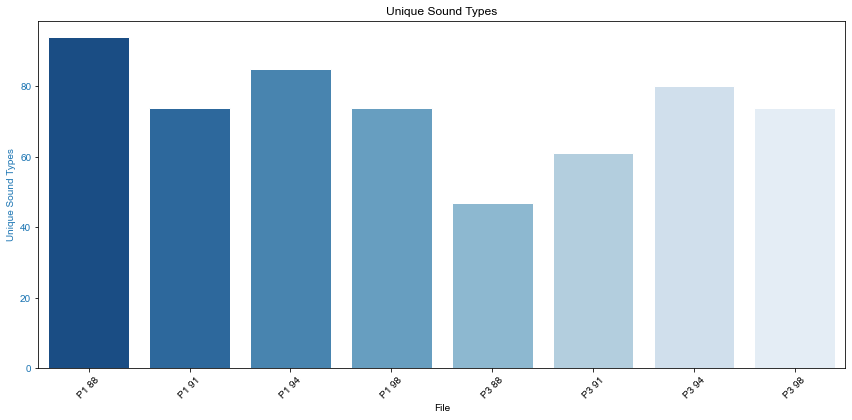

In [14]:
from IPython.display import Image, display

display(Image("./media/3.png"))

Perhaps surprisingly, the results do overlap with the more large-scale tendency in the dimension reduction algorithm. Though differing in amount, the general direction of change mirrors the spectral diversity perfectly. Where P1 displays a diminishing variation of sounds between the first two sample years, both channels exhibit a noticeable increase toward the third sample set, which finally declines in the year. This gives credence to the theory that SR might have been trying to identify through variation. There appears to be an inherent contradiction to the project of creating identity by non-identity. Viewed in its historical context, however, there are good causes to consider the influence of the of content diversity. Parallel to the commercialization of Swedish radio, another relevant process took place. 

In the spring of 1993, the words “relative entropy” suddenly covered the pages of the Swedish press. Swedish television had won the price for highest entropy. This enigmatic concept was coined by telecommunication professors Jacob Wakshlag and William Adams in 1985, but received its popularization through the “Quality Assessment of Broadcast Programming” (QABP) report (<cite data-cite="14492245/8ZHX9NGF"></cite>). QABP was a global research project instigated at the university of Tokyo in the early 1990s. Prompted by worries about the increasingly free-marked oriented structure of mass media, researchers set out to determine a definitive measurement of “quality” for broadcasting to navigate towards. In a somewhat surprising twist, however, the answer decided upon turned out to be related to quantity. Mass media ought to provide the highest variation in content possible. In a large-scale study comparing broadcasting from 26 countries, QABP measured the quantitative variation of content on individual channels, and Swedish public service television received the best score.

This had to affects. In the first place, it granted the question of entropy, variation and unpredictability a renewed status in media production in Sweden. Secondly, because Swedish radio also had been evaluated and received a much lower score than television, it might have spurred producers in the direction of all sorts of diversity. To fully explore the correlation between these events is a matter I develop in my dissertation, and which far exceeds the scope of this text. Yet, I hope that the correlation between the more global development in both object detection and dimension reduction might convince the reader that the tendency carries some value. And if so, we are also forced to consider the apparent short-livedness of this trend.

# Summery

This experiment has taken place on the threshold. On the threshold between listening and counting. On the threshold between differences in sound. Finally, it also plays out on the threshold to the scientifically valid. The sample sizes have been too small to actually confirm the findings on a solid base, despite strong indications. I hope that the reader still can see the value in the results. The analysis of audio data from annual sample sets reveals a shift in the number of detected occurrences for each year, with varying sonic sequences reflecting the overall structure of the broadcasting. Using PCA and UMAP, we observe differences in the MFCC data and clustering between P1 and P3, suggesting distinct sonic identities. Pretrained audio classification models highlight the limitations of dimensionality reduction techniques in capturing cultural nuances, though they do offer new ways of understanding radio sounds. The evolution of P1 and P3's sonic identities may be influenced by the commercialization of Swedish radio and the concept of entropy, which underlines the importance of variation in content. Despite some correlation between object detection and dimension reduction, the pursuit of sonic diversity seems short-lived, warranting further exploration of the relationship between these trends and the historical context.

However, beyond these historical endeavors, my aim has also been to contribute to the understanding of historical radio data. By suggesting relatively simple methods for preprocessing and segmentation, the sonically curious reader might find inspiration future improvements in working with cultural audio data. Furthermore, I want to stress the methodological consequences of the experiments with combining dimension reduction and object classification. The initial observation in the analysis suggested an incongruity between untrained dimension reduction techniques for spectral distribution and pretrained object classification models. However, considered in a larger perspective of change over time, the approaches seem to capture similar aspects in the global development in the data set. Such an observation points to the benefits of complementary usage of the two methods. It shows the value of allowing pretrained and untrained algorithms to be experimentally combined. Each approach allows for different insights into the local and fine-grained aspects of audio data, but together it may be utilized to test the validity of the results.

# Bibliography

<div class="cite2c-biblio"></div>